<a href="https://colab.research.google.com/github/agb2k/Computer-Vision-CW-G4/blob/master/Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# The main folder where the coursework materials are
%cd '/content/drive/My Drive/COMP3029/2021-2022/Multiview_jpg/Bad seeds/Set1'
!ls

/content/drive/.shortcut-targets-by-id/11Q4v2RDirI4gcUYPTVZrz1zP431Q2bpd/Set1
front_S1.jpg  left_S1.jpg  rear_S1.jpg	right_S1.jpg  top_S1.jpg


In [ ]:
import cv2 
import math
import imutils
import numpy as np
from statistics import mean
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

(2268, 4032, 3)


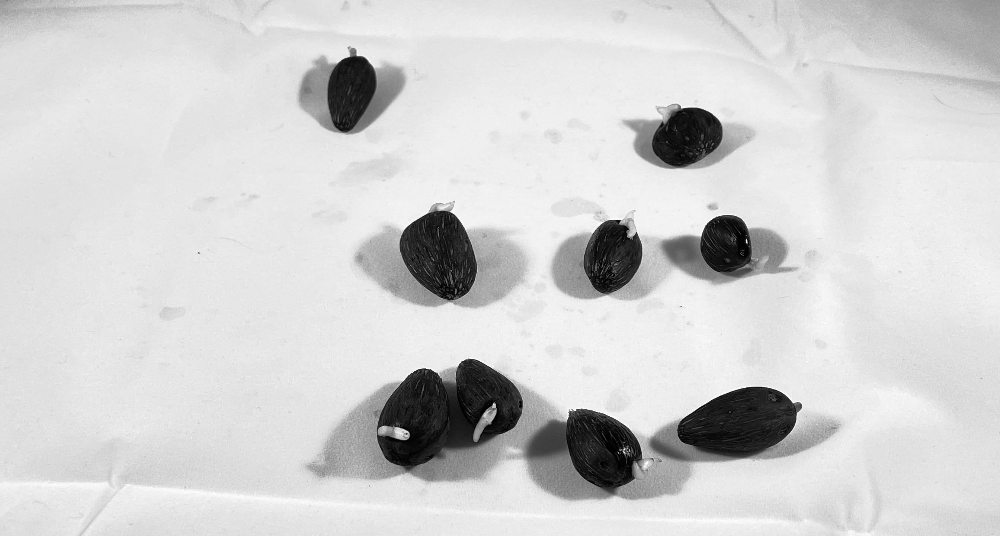

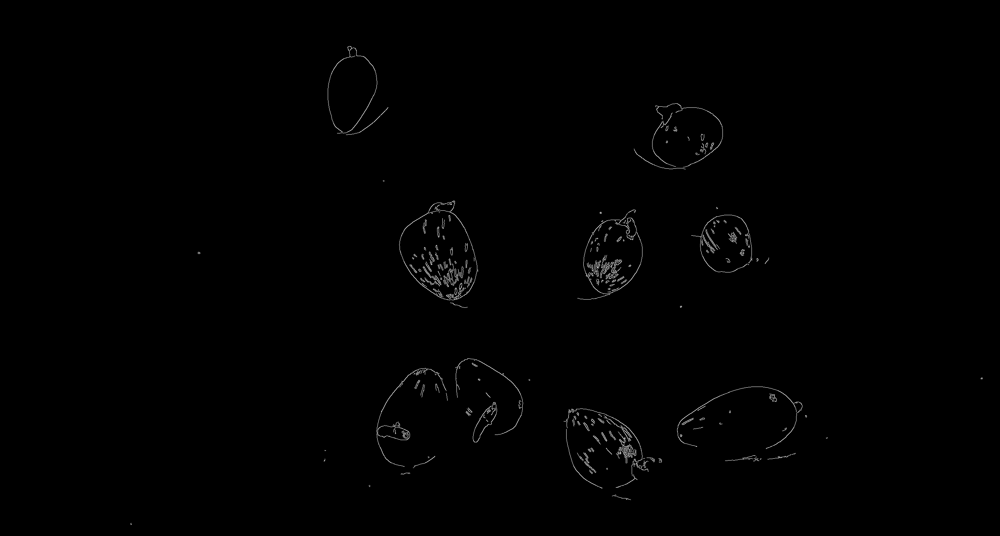

6.0
27.5
6.5
25.0
7.0
3.5
51.5
66.0
58.5
314.0
57.5
515.5
2.5
14.0
101.5
2.0
75.5
84.0
87.0
51.0
20.5
1.0
12.5
100.0
31.0
102.0
41.0
23.5
112.5
11.5
39.0
13.5
5921.5
180.0
2667.5
257.5
10.5
1103.5
117.0
89.0
86.5
6.5
14.0
10.5
3324.0
43.5
544.5
12.0
21.0
8.0
18.5
17283.0
14.5
24487.5
10.0
37924.5
5.5
24291.5
20608.0


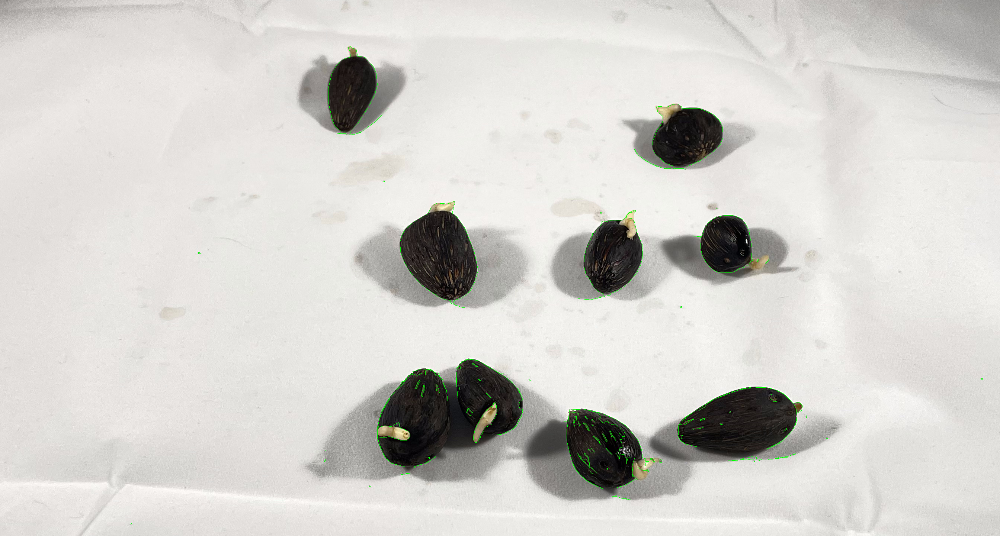

-1

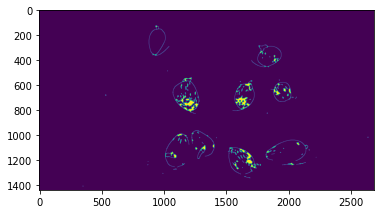

In [ ]:
#reading the image  
img = cv2.imread("front_S1.jpg")
print(img.shape)
y = img.shape[0]//11
x = img.shape[1]//6
h = img.shape[0]//11 * 7
w = int(img.shape[1]//3 * 2)
image = img.copy()[y:y+h, x:x+w]
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)
im_remove_noise= cv2.fastNlMeansDenoising(img_gray, 8, 8, 7, 21) 
edged = cv2.Canny(im_remove_noise,130,240) 

cv2_imshow(edged)
cv2.waitKey(0) 

#applying closing function  
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (8, 8)) 
closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)

plt.imshow(closed)
cv2.waitKey(0) 

min_threshold_area = 500     #threshold area  
max_threshold_area = 50000


#finding_contours
(cnts, _) = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 


for c in cnts:
		area = cv2.contourArea(c)
	#if max_threshold_area > area > min_threshold_area:
		peri = 0.1*cv2.arcLength(c, True)
		approx = cv2.approxPolyDP(c, 0.02 * peri, True)
		cv2.drawContours(image, [approx], -1, (0, 255, 0), 1)
		print(area)


 
 
cv2_imshow(image)
cv2.waitKey(0) 

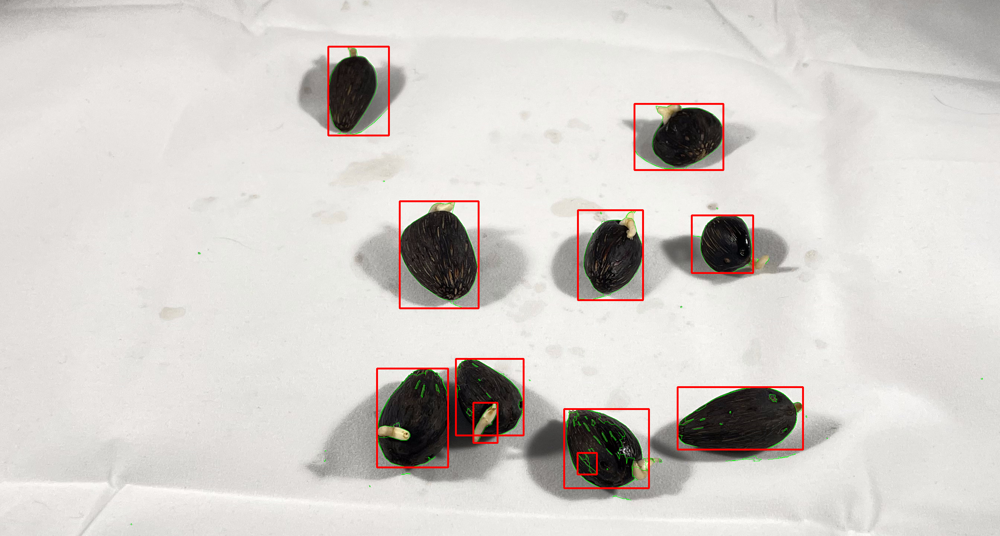

-1

In [ ]:
idx = 0 
copy = image.copy()
for c in cnts: 
	x,y,w,h = cv2.boundingRect(c)
	area = cv2.contourArea(c)
	if max_threshold_area > area > min_threshold_area:
		cv2.rectangle(image,(x, y), (x + w, y + h),(0,0,255),3)	
	#if w>50 and h>50: 
		#idx+=1 
		#new_img=image[y:y+h,x:x+w]
		#cv2.imwrite('Image Segmented_'+ str(idx) + '.png', new_img)
		#cv2_imshow(new_img)
cv2_imshow(image)
cv2.waitKey(0) 